In [1]:
import matplotlib as mpl
from matplotlib import pyplot as plt
from matplotlib.animation import FuncAnimation
import numpy as np
import pandas as pd
import IPython
from pdb import set_trace as bp

import datetime
ft = "%Y_%m_%d_%H:%M:%S%z"

# wave crest test

In [5]:
# simple animation function

fig = plt.figure(figsize = (5,5))
ax = fig.add_subplot()

x_bounds = [-10,10]
y_bounds = [-10,10]
ax.set_xlim(*x_bounds)
ax.set_ylim(*y_bounds)
ax.set_xticks(np.arange(*x_bounds,1))
ax.set_yticks(np.arange(*y_bounds,1))
ax.grid(True)

t = 5
fps = 20
dt = 1/fps
n_frames = t*fps
print(f"estimated load time: {t*fps/10}s")

x = np.linspace(*x_bounds,100)
y = np.sin(x)

#wave
line, = ax.plot(x,y)

def init():
  return line,

def update(frame):
  line.set_data(x,np.sin(x+frame))
  return line,

ani = FuncAnimation(fig=fig, init_func = init, func=update, frames=n_frames, interval=(dt*1000),blit = True)

plt.close()
IPython.display.HTML(ani.to_jshtml())

# ani.save(f"animation_{datetime.datetime.now().strftime(ft)}.gif") #cant also display inline for some reason - not worth figuring out




estimated load time: 10.0s


# 1d wave equation



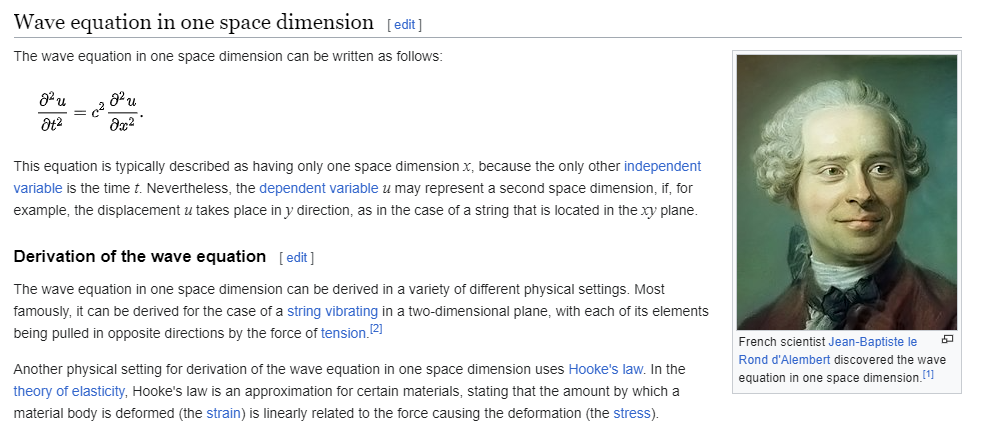
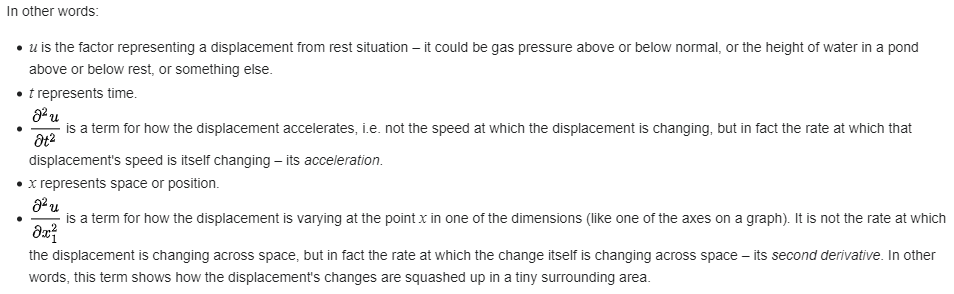

https://www.youtube.com/watch?v=yrygoOfnll4 This video derives it well

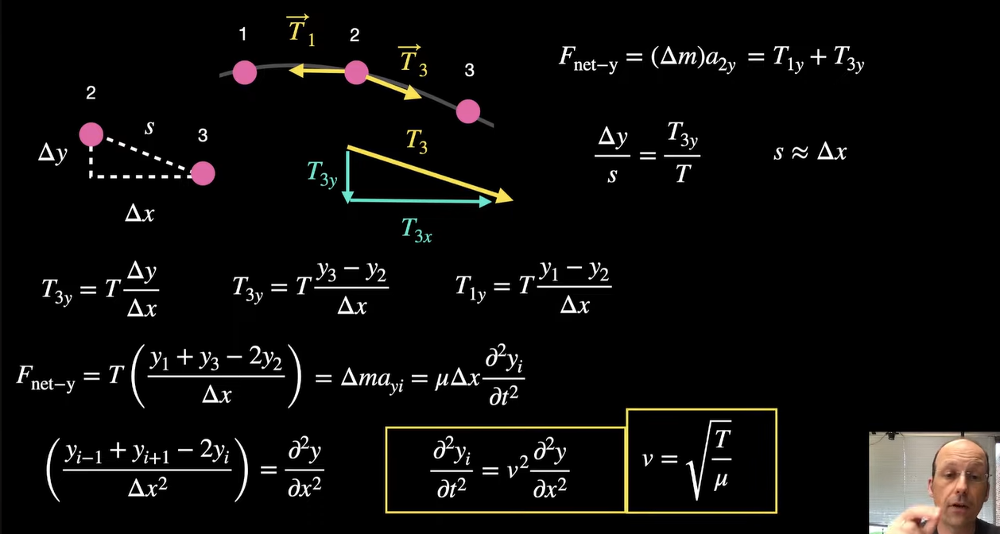

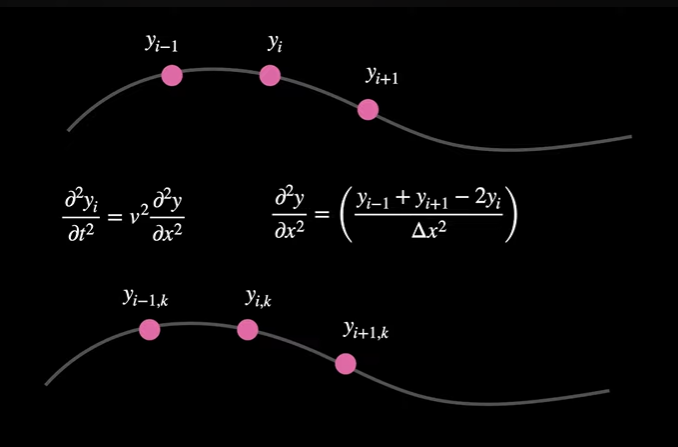

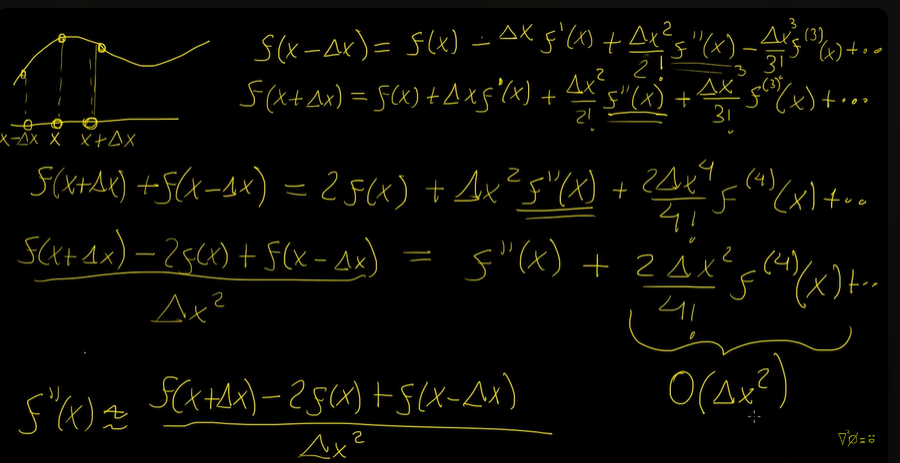

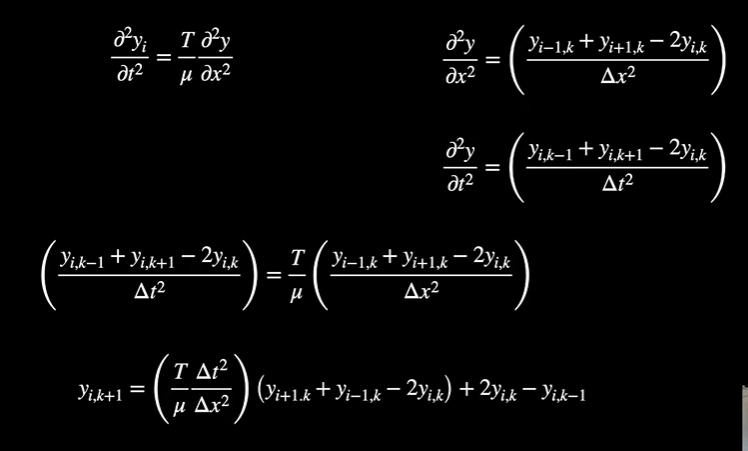

In [93]:
# simple animation function

L = 10
dx = 0.1
t = 5
fps = 30
T = 50 #tension
mu = 10 #density


x_bounds = [0,L]
y_bounds = [-5,5]
scale = 3
fig = plt.figure(figsize = ((x_bounds[1]-x_bounds[0])/scale,(y_bounds[1]-y_bounds[0])/scale))
ax = fig.add_subplot()
ax.set_xlim(*x_bounds)
ax.set_ylim(*y_bounds)
ax.set_xticks(np.arange(*x_bounds,1))
ax.set_yticks(np.arange(*y_bounds,1))
ax.grid(True)

dt = 1/fps
n_frames = t*fps

x = np.arange(*x_bounds,dx)
# image each point is a finite mass m connected by springs
# with mass = density * delta_x - Doesnt actaully matter unless you want to model real life

#store is as a 2d array
# first row is past, second is present last if future
y = np.zeros([3,len(x)])


#imagine we control the left endpoint

#wave
line, = ax.plot(x,y[1,:])
point1 = ax.scatter(x[0],y[1,0],color = "red")
point2 = ax.scatter(x[0],y[1,-1],color = "red")

def init():
    return line, point1, point2

def update(frame,y):
    rps = 0.5
    theta = frame/fps * 2*np.pi * rps

    #update y and y_past
    y[0,:] = y[1,:]
    y[1,:] = y[2,:]

    line.set_data(x,y[1,:])
    point1.set_offsets([x[0],y[1,0]])
    point2.set_offsets([x[0],y[1,-1]])

    #print(y)

    # solve for y future
    # change the differential equation into a "finite difference"
    # finite difference approximation of second order derivatinve using taylors expansions
    # https://www.youtube.com/watch?app=desktop&v=zNPNntM_hNM
    # be careful about indexing here

    # "manually" change posiiton of y0
    y[1,0] = 2*np.sin(min(np.pi,0 + theta))
    y[1,-1] = 2*np.sin(min(np.pi,0 + theta)) # change to = 0 to keep fixed
    
    c = T/mu * dt**2/dx**2 #constant used to adjust for mass change in time and other things
    

    y[2,0] = y[1,0]
    y[2,1:-1] = c*(y[1,2:] + y[1,0:-2] - 2*y[1,1:-1]) + 2*y[1,1:-1] - y[0,1:-1]
    # keep last point fixed
    #test constructive interference
    y[2,-1] = y[1,-1]
    return line, point1, point2

ani = FuncAnimation(fig=fig, init_func = init, func=update, frames=n_frames, fargs = (y,),interval=(dt*1000), blit = True)

plt.close()
IPython.display.HTML(ani.to_jshtml())

# ani.save(f"animation_{datetime.datetime.now().strftime(ft)}.gif") #cant also display inline for some reason - not worth figuring out


